# Evaluation of Google Dynamic World Time Series

In [1]:
import ee
import geemap
import geemap.colormaps as cm

In [2]:
import os
import sys
import pandas as pd
import geopandas as gpd

from munch import Munch
from shapely.geometry import Polygon
#from IPython.display import Image

import seaborn as sns
import matplotlib.pyplot as plt

### Setup working environment

In [3]:
# define repo name and get root working directory
repo = 'dynamicworld'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo ) ]

In [4]:
# add src sub dir to system path
sys.path.append( os.path.join( root_path, 'src' ) )

In [5]:
# import local helper classes
from dw import DynamicWorld
from metrics import Metrics
from viz import Viz

### Initialise Earth Engine API

In [6]:
try:
    # initialise earth engine api
    ee.Initialize( project='test4ei' )
    
except BaseException as e:
    
    # reauthenticate and initialise earth engine api on error
    ee.Authenticate()    
    ee.Initialize( project='test4ei' )

### Initialise arbitrary region of interest and timeframe

In [7]:
# home
coords = [ [ -2.8, 51.3], 
           [ -2.8, 51.1],
           [ -2.4, 51.1],
           [ -2.4, 51.3 ] ]

In [8]:
# load coordinates into geodataframe - determine utm zone
gdf = gpd.GeoDataFrame( index=[0], crs='EPSG:4326', geometry=[ Polygon(coords) ] )
zone = gdf.estimate_utm_crs().to_epsg()
zone

32630

In [9]:
# convert total bounds into earth engine region of interest
roi = ee.Geometry.Rectangle( tuple( gdf.total_bounds ) )

### Utility Functions

In [10]:
def get_datasets( roi, intervals ):

    """
    Get Dynamic World datasets
    
    Parameters        
    ----------
    roi : ee.Geometry
        region of interest
    intervals : dict
        start and end dates

    Returns
    -------
    List :
        Temporally aggregated DynamicWorld datasets encoded as dicts
    """

    # iterate over intervals
    datasets = []
    for interval in intervals:

        # get dynamic images collated with roi and temporal window
        collection = DynamicWorld.get_data( roi, interval[ 'start' ], interval[ 'end' ] )

        # add mode and max median land cover maps to list combined with interval
        datasets.append( {
                        'mode' : DynamicWorld.add_metadata( DynamicWorld.get_mode_label( collection ), interval ),
                        'max_median' : DynamicWorld.add_metadata( DynamicWorld.get_max_median_label( collection ), interval )
                    }   | interval
        )

    return datasets

### Visualise interannual and seasonal variability across Dynamic World dataset

In [12]:
# get quarterly intervals between 2018-2024
intervals = DynamicWorld.get_intervals( '2018-01-01', '2024-12-31', '3M' )

In [13]:
def is_summer_interval( interval ):

    # convert to datetime
    start = pd.to_datetime( interval[ 'start' ] )
    end = pd.to_datetime( interval[ 'end' ] )

    # identify spring and summer intervals
    return start.month >= 4 and end.month <= 9 and start.year == end.year

# filter intervals
summer_intervals = [ i for i in intervals if is_summer_interval(i) ]

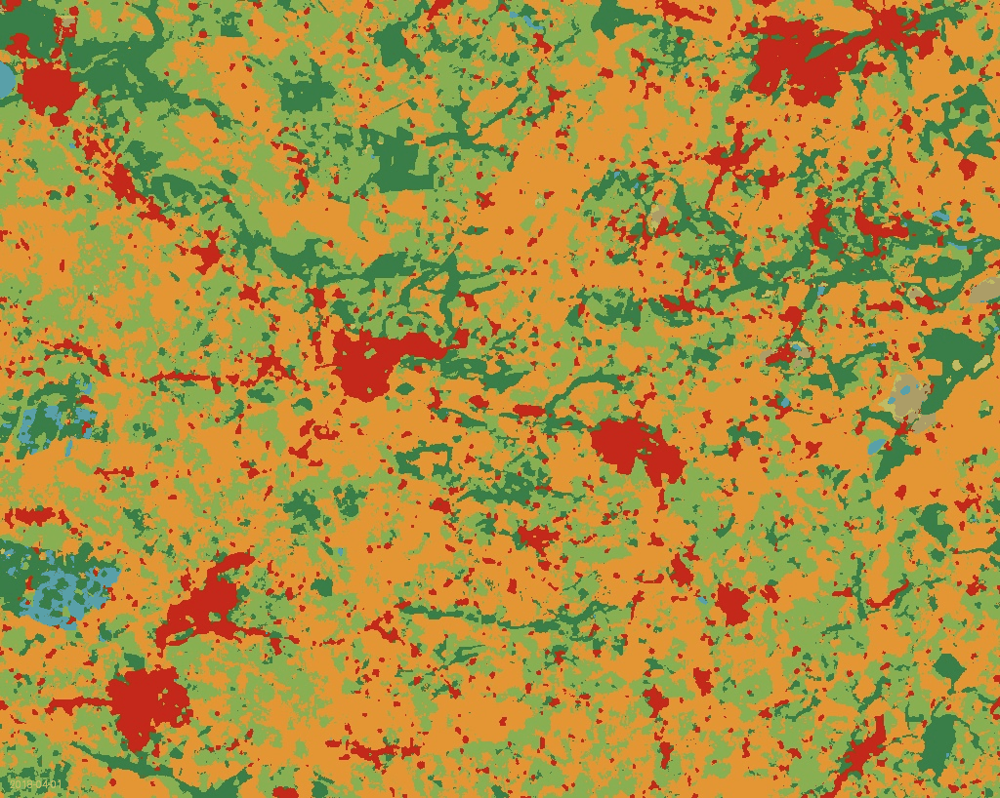

In [14]:
# get mode aggregated collection for spring and summer months 2018 - 2024
datasets = get_datasets( roi, summer_intervals )
collection = ee.ImageCollection.fromImages( [ d[ 'mode' ].select( 'label' ) for d in datasets ] ) 

# plot animated gif
Viz.get_annotated_animation(collection, region=roi, dimensions=1024 )

### Interactively compare land cover labels for spring and summer in 2022

In [15]:
# spring and summer 2022
intervals = [ {'start': '2022-04-01', 'end': '2022-06-30'},
              {'start': '2022-07-01', 'end': '2022-09-30'} ]

# get dynamic world datasets collocated with spatiotemporal constraints
datasets = get_datasets( roi, intervals )

In [16]:
# display differences between spring and summer
m = Viz.plot_label_images( datasets, roi )
m

Map(center=[51.20009810245082, -2.5999999999991954], controls=(WidgetControl(options=['position', 'transparent…

### Evaluate differences between mode and max median aggregated land cover maps

In [17]:
# take first dataset
dataset = datasets[ 0 ]

# set up confusion matrix bands
reference = dataset[ 'mode' ].select( 'label' )
prediction = dataset[ 'max_median' ].select( 'label' )

# compute error matrix and accuracy
em, accuracy = Metrics.get_error_matrix( reference, prediction, region=roi )
accuracy

0.9302139695031972

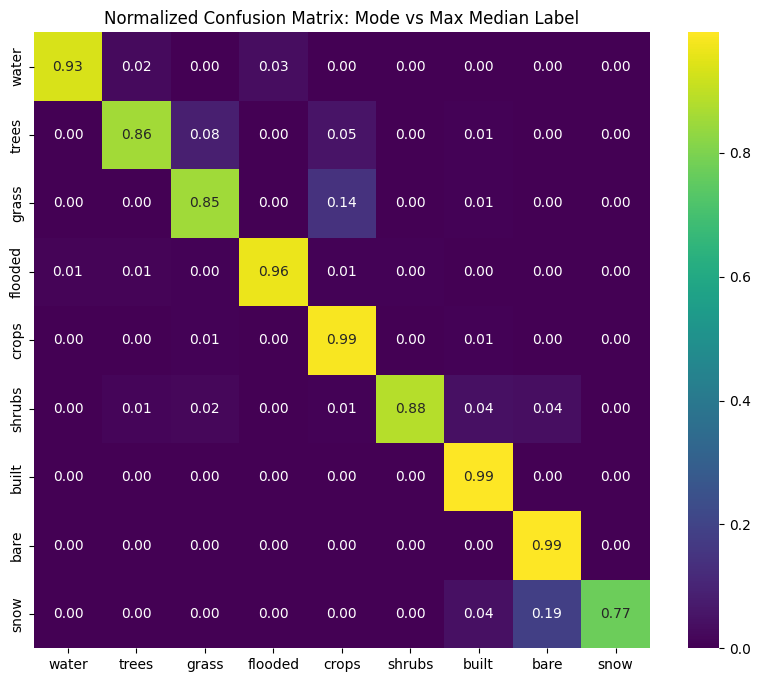

In [18]:
# plot confusion matrix
plt.figure(figsize=(10, 8))

# get normalised error matrix
norm_em = Metrics.get_normalised_error_matrix( em, list( DynamicWorld.legend.keys() ) )
sns.heatmap( norm_em, 
             annot=True, 
             cmap='viridis', 
             fmt='.2f',
             xticklabels=norm_em.columns, 
             yticklabels=norm_em.index, 
             square=True )

plt.title('Normalized Confusion Matrix: Mode vs Max Median Label')
plt.show()

### Assess temporal consistency of land cover label across interannual time series

In [19]:
# get late spring / summer interval timeseries
intervals = []
for year in range( 2017, 2025 ):
    intervals.append( {'start': f'{year}-05-01', 'end': f'{year}-08-31'} )

In [20]:
# get dynamic world datasets collocated with spatiotemporal constraints
datasets = get_datasets( roi, intervals )

In [21]:
# get label images for mode and max_median aggregated datasets
label = {
        'mode' : ee.ImageCollection.fromImages( [ d[ 'mode' ].select( 'label' ) for d in datasets ] ),
        'max_median' : ee.ImageCollection.fromImages( [ d[ 'max_median' ].select( 'label' ) for d in datasets ] )
}

In [22]:
def get_temporal_consistency( collection ):

    # get number of distinct labels over time 
    distinct_count = collection.reduce( ee.Reducer.countDistinctNonNull() )
    
    # total number of time steps
    samples = ee.Image( collection.size() )

    # compute normalised consistency where 1 = same label throughout; 0 = all labels different
    return ee.Image( samples.subtract( distinct_count ) ) \
                            .divide( samples.subtract( 1 ) ) \
                            .rename( 'consistency' )

In [23]:
# compute consistency of interannual mode and max median interannual time series
consistency = {
        'mode' : get_temporal_consistency( label[ 'mode' ] ),
        'max_median' : get_temporal_consistency( label[ 'max_median' ] )
}

### Visualise temporal consistency of mode and max median aggregated interannual time series

In [24]:
# create map
m = geemap.Map( center=roi.centroid().coordinates().getInfo()[::-1], zoom=10, add_google_map=False )

# display mode and max median consistency image layers
m.addLayer( consistency [ 'mode' ], { 'min' : 0.35, 'max' : 0.95, 'palette': cm.palettes.viridis }, 'mode', True )
m.addLayer( consistency [ 'max_median' ], { 'min' : 0.35, 'max' : 0.95, 'palette': cm.palettes.viridis }, 'max median', True )

# add layer control and centre to roi
m.add_layer_control()
m

Map(center=[51.20009810245082, -2.5999999999991954], controls=(WidgetControl(options=['position', 'transparent…

### Evaluate impact of temporal smoothing on interannual consistency

In [25]:
def apply_temporal_smoothing( collection, **kwargs ):

    # parse parameters + defaults from dict
    window_size = kwargs.get( 'window_size', 2 )
    start_year = kwargs.get( 'start_year', 2017 )
    end_year = kwargs.get( 'start_year', 2024 )

    # iterate for each year
    images = []
    for year in range( start_year, end_year + 1 ):

        # filter collection for moving temporal window
        subset = collection.select( 'label' ) \
                            .filterDate(f'{year-window_size}-01-01', 
                                       f'{year+window_size}-12-31' )

        # get range of date filter
        d1 = ee.Date( f'{year}-01-01' )
        d2 = ee.Date( f'{year}-12-31' )

        # add start and end dates as metafields
        meta = ee.Dictionary( { 'system:time_start' : d1.millis(), \
                                    'system:time_end' : d2.millis() } )

        # compute mode of collection subset + add to list
        images.append( subset.mode().rename( subset.first().bandNames() ).set( meta ) )
        
    return ee.ImageCollection.fromImages( images )

In [26]:
# compute temporally smoothed max median aggregated interannual time series
label[ 'max_median_smooth' ] = apply_temporal_smoothing( label[ 'max_median' ] )

In [27]:
# compute consistency of temporally smoothed max median aggregated interannual time series
consistency[ 'max_median_smooth' ] = get_temporal_consistency( label[ 'max_median_smooth' ] )

In [28]:
m = geemap.Map( center=roi.centroid().coordinates().getInfo()[::-1], zoom=10, add_google_map=False )

# legend keys and values
keys = list( DynamicWorld.legend.keys() )
colors = list( DynamicWorld.legend.values() )

# convert collections to lists
max_median = label[ 'max_median' ].toList( label[ 'max_median' ].size() )
max_median_smooth = label[ 'max_median_smooth' ].toList( label[ 'max_median_smooth' ].size() )

# add successive max median raw and consistency layers
m.addLayer( ee.Image( max_median.get(2) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'raw 2019', True )
m.addLayer( ee.Image( max_median.get(3) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'raw 2020', False )
m.addLayer( ee.Image( max_median.get(4) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'raw 2021', False )
m.addLayer( consistency[ 'max_median' ], { 'min' : 0.4, 'max' : 1.0, 'palette': cm.palettes.viridis }, 'consistency raw', False )

# add successive max median smoothed layers
m.addLayer( ee.Image( max_median_smooth.get( 2 ) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'smooth 2019', True )
m.addLayer( ee.Image( max_median_smooth.get( 3 ) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'smooth 2020', False )
m.addLayer( ee.Image( max_median_smooth.get( 4 ) ), { 'min' : 0, 'max' : 8, 'palette' : colors }, 'smooth 2021', False )
m.addLayer( consistency[ 'max_median_smooth' ], { 'min' : 0.4, 'max' : 1.0, 'palette': cm.palettes.viridis }, 'consistency smooth', False )
    
# add legend
m.add_legend( keys=keys, colors=colors, position='bottomleft')

# add layer control and centre to roi
m.add_layer_control()
m

Map(center=[51.20009810245082, -2.5999999999991954], controls=(WidgetControl(options=['position', 'transparent…